In [ ]:
# !pip install tweepy

In [ ]:
import tweepy
import pandas as pd
import numpy as np
import os

In [ ]:
%pwd

'C:\\Users\\Mahdi\\Desktop\\Pedagogy\\Project\\data'

In [ ]:
%cd C:/Users/Mahdi/Desktop/Pedagogy/Project/data1

os.getcwd()

C:\Users\Mahdi\Desktop\Pedagogy\Project\data1


'C:\\Users\\Mahdi\\Desktop\\Pedagogy\\Project\\data1'

In [ ]:
consumer_key='***'
consumer_key_secret='***'
access_token= '1392749972-***'
access_token_secret='***'

In [ ]:

# Create a hashtags list
hashtags = ["#distancelearning", \
            "#onlineschool",     \
            "#onlineteaching",   \
            "#virtuallearning",  \
            "#onlineducation",   \
            "#distanceeducation",\
            "#OnlineClasses",    \
            "#DigitalLearning",  \
            "#elearning",        \
            "#onlinelearning"]

# Create a search list
search_list = ["distance learning",  \
               "online teaching",    \
               "online education,",  \
               "online course",      \
               "online semester",    \
               "distance course",    \
               "distance education", \
               "online class",       \
               "e-learning",         \
               "e learning"]


# # Get the necessary API information from a text file
# with open('../twitter_api.txt') as file:
#     consumer_key, consumer_key_secret, access_token, access_token_secret = [line.strip('\n').split('=')[1] for line in file.readlines()]

# Setup tweepy with Twitter credentials
auth = tweepy.OAuthHandler(consumer_key, consumer_key_secret)
auth.set_access_token(access_token, access_token_secret)
api = tweepy.API(auth, wait_on_rate_limit=True, wait_on_rate_limit_notify=True)

# Define a function to get tweets
def get_tweets(search, isHashtag):
    
    # Create a pandas DataFrame
    df_temp = pd.DataFrame(columns=["Content", "Location", "Username", "Retweet-Count", "Favorites", "Created at"])
    
    # Get the tweets
    tweets = tweepy.Cursor(api.search, q= search+" -filter:retweets", lang="en",since="2020-04-01", tweet_mode='extended').items(100000)
    
    # Iterate over tweets
    for tweet in tweets:
        content = tweet.full_text
        username = tweet.user.screen_name
        location = tweet.user.location
        created_at = tweet.created_at
        retweetcount = tweet.retweet_count
        favorites = tweet.favorite_count
        
        # Create a list consists of the features
        retrieved = [content, location, username, retweetcount, favorites, created_at]
        
        # Append list to the DataFrame
        df_temp.loc[len(df_temp)] = retrieved
        
    # Generate unique filename
    path = os.getcwd()
    
    # Generate a filename for hashtags or specific word
    if isHashtag:
        filename = path  + search[1:] + '_hashtag.csv'
    else:
        filename = path  + search.replace(" ", "") + '_wordsearch.csv'
    # Save the csv file
    df_temp.to_csv(filename)


# Call get_tweets function for each hashtag and search word

for hashtag in hashtags:
    get_tweets(hashtag, isHashtag=True)

for search in search_list:
    get_tweets(search, isHashtag=False)

Rate limit reached. Sleeping for: 762
Rate limit reached. Sleeping for: 792
Rate limit reached. Sleeping for: 765


In [ ]:
os.getcwd()

'C:\\Users\\Mahdi\\Desktop\\Pedagogy\\Project\\data'

In [ ]:
path

'C:\\Users\\Mahdi\\Desktop\\Pedagogy\\Project\\data'

In [ ]:

# Import the necessary libraries
import pandas as pd
import os


# Concatenate the DataFrames and save as corpus

# Get csv file names in output directory
path = os.getcwd() 
files = os.listdir(path)

# Create a list to store DataFrames
df_list = []

# Iterate over files in output dir and append DataFrames into df_list
for file in files:
    df = pd.read_csv(path +'\\'+ file, index_col=None)
    df_list.append(df)

# Create a DataFrame
tweets_raw = pd.concat(df_list, axis=0, ignore_index=True)

# Save the DataFrame as a csv file
tweets_raw.to_csv("tweets_raw.csv")

In [ ]:
# Load the tweets
tweets_raw = pd.read_csv("tweets_raw.csv")
# Display the first five rows
display(tweets_raw.head())
# Print the summary statistics
print(tweets_raw.describe())
# Print the info
print(tweets_raw.info())

,Unnamed: 0,Unnamed: 0.1,Content,Location,Username,Retweet-Count,Favorites,Created at
0,0,0,Join @MicrosoftUK at 2pm on Tues 15 June for a...,"North West, England",JCPinManchester,0,0,2021-06-12 17:00:58
1,1,1,A Beginners Journey into #xAPI and #eLearning ...,"Arizona, USA",bschlenker,0,0,2021-06-12 16:20:31
2,2,2,Latest Vacancy: Historic England @HistoricEngl...,uk,Diversityjobs4u,0,0,2021-06-12 16:04:00
3,3,3,The plan for transforming education in Europe ...,Washington D.C,WBG_Education,3,13,2021-06-12 16:01:29
4,4,4,How to Incorporate Digital Assessments in the ...,NaN,DR_SIPPI,1,0,2021-06-12 15:37:13


         Unnamed: 0  Unnamed: 0.1  Retweet-Count     Favorites
count  41919.000000  41919.000000   41919.000000  41919.000000
mean   20959.000000   2141.400129       1.821227      3.690021
std    12101.117304   1759.133905      11.587619     42.755857
min        0.000000      0.000000       0.000000      0.000000
25%    10479.500000    690.000000       0.000000      0.000000
50%    20959.000000   1727.000000       0.000000      0.000000
75%    31438.500000   3167.000000       1.000000      2.000000
max    41918.000000   7715.000000     761.000000   6673.000000
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41919 entries, 0 to 41918
Data columns (total 8 columns):
Unnamed: 0       41919 non-null int64
Unnamed: 0.1     41919 non-null int64
Content          41919 non-null object
Location         32702 non-null object
Username         41919 non-null object
Retweet-Count    41919 non-null int64
Favorites        41919 non-null int64
Created at       41919 non-null object
dtypes: int64(4),

In [ ]:
# We do not need first two columns. Let's drop them out.
tweets_raw.drop(columns=["Unnamed: 0", "Unnamed: 0.1"], axis=1, inplace=True)
# Drop duplicated rows
tweets_raw.drop_duplicates(inplace=True)
# Created at column's type should be datatime
tweets_raw["Created at"] = pd.to_datetime(tweets_raw["Created at"])
# Print the info again
print(tweets_raw.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 38212 entries, 0 to 41918
Data columns (total 6 columns):
Content          38212 non-null object
Location         29712 non-null object
Username         38212 non-null object
Retweet-Count    38212 non-null int64
Favorites        38212 non-null int64
Created at       38212 non-null datetime64[ns]
dtypes: datetime64[ns](1), int64(2), object(3)
memory usage: 2.0+ MB
None


In [ ]:
import nltk
import re
"""
nltk.download('punkt')
nltk.download('wordnet')
"""

# Import word_tokenize and stopwords from nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

def process_tweets(tweet):
    
    # Remove links
    tweet = re.sub(r"http\S+|www\S+|https\S+", '', tweet, flags=re.MULTILINE)
    
    # Remove mentions and hashtag
    tweet = re.sub(r'\@\w+|\#','', tweet)
    
    # Tokenize the words
    tokenized = word_tokenize(tweet)

    # Remove the stop words
    tokenized = [token for token in tokenized if token not in stopwords.words("english")] 

    # Lemmatize the words
    lemmatizer = WordNetLemmatizer()
    tokenized = [lemmatizer.lemmatize(token, pos='a') for token in tokenized]

    # Remove non-alphabetic characters and keep the words contains three or more letters
    tokenized = [token for token in tokenized if token.isalpha() and len(token)>2]
    
    return tokenized
    
# Call the function and store the result into a new column
tweets_raw["Processed"] = tweets_raw["Content"].str.lower().apply(process_tweets)

# Print the first fifteen rows of Processed
display(tweets_raw[["Processed"]].head(15))

,Processed
0,"[join, tues, june, free, virtual, workshop, le..."
1,"[beginners, journey, xapi, elearning, games, j..."
2,"[late, vacancy, historic, england, seeking, di..."
3,"[plan, transforming, education, europe, amp, c..."
4,"[incorporate, digital, assessments, classroom,..."
5,"[beginners, journey, xapi, elearning, games, j..."
6,"[join, thurs, june, free, virtual, workshop, l..."
7,"[interactive, elearningexample, solve, escape,..."
8,"[let, travel, australia, today, lesson, explor..."
9,"[aestheticpractitioner, aesthetics, aesthetic,..."


In [ ]:
# Get the tweet lengths
tweets_raw["Length"] = tweets_raw["Content"].str.len()
# Get the number of words in tweets
tweets_raw["Words"] = tweets_raw["Content"].str.split().str.len()
# Display the new columns
display(tweets_raw[["Length", "Words"]])

,Length,Words
0,291,42
1,291,29
2,251,26
3,322,41
4,189,17
5,263,27
6,299,45
7,281,21
8,305,32
9,251,17


In [ ]:
# Fill the missing values with unknown tag
tweets_raw["Location"].fillna("unknown", inplace=True)

In [ ]:
# Print the unique locations and number of unique locations
print("Unique Values:",tweets_raw["Location"].unique())
print("Unique Value count:",len(tweets_raw["Location"].unique()))

Unique Values: ['North West, England' 'Arizona, USA' 'uk' ... 'Apex, nc ' 'Covington, VA'
 'GTA, Ontario']
Unique Value count: 7740


In [ ]:
# !pip install pycountry

  Created wheel for pycountry: filename=pycountry-20.7.3-py2.py3-none-any.whl size=10738097 sha256=410d368fb3946aebf8a1da871e29e059c02f1a4047cfe19f1dcaec0d8619e5f3
  Stored in directory: c:\users\mahdi\appdata\local\pip\cache\wheels\57\e8\3f\120ccc1ff7541c108bc5d656e2a14c39da0d824653b62284c6
Successfully built pycountry


You should consider upgrading via the 'c:\users\mahdi\anaconda3\python.exe -m pip install --upgrade pip' command.


In [ ]:
# Import pycountry
import pycountry

def get_countries(location):
    
    # If location is a country name return its alpha2 code
    if pycountry.countries.get(name= location):
        return pycountry.countries.get(name = location).alpha_2
    
    # If location is a subdivisions name return the countries alpha2 code
    try:
        pycountry.subdivisions.lookup(location)
        return pycountry.subdivisions.lookup(location).country_code
    except:
        # If the location is neither country nor subdivision return the "unknown" tag
        return "unknown"

# Call the function and store the country codes in the Country column
tweets_raw["Country"] = tweets_raw["Location"].apply(get_countries)

# Print the unique values
print(tweets_raw["Country"].unique())

# Print the number of unique values
print("Number of unique values:",len(tweets_raw["Country"].unique()))

['unknown' 'GB' 'LB' 'US' 'PK' 'LR' 'IN' 'MT' 'FR' 'ZA' 'AU' 'CA' 'SZ'
 'DE' 'GG' 'SE' 'ES' 'GE' 'JM' 'NO' 'AF' 'FJ' 'KE' 'FI' 'SV' 'NP' 'UG'
 'NG' 'AE' 'NL' 'LK' 'JP' 'GH' 'NA' 'PH' 'TR' 'HK' 'AT' 'ID' 'DK' 'CM'
 'NZ' 'IT' 'MY' 'HU' 'MU' 'MM' 'IE' 'BD' 'LU' 'AL' 'AG' 'IL' 'JE' 'GR'
 'SG' 'GL' 'LS' 'EG' 'ZW' 'SA' 'CR' 'ZM' 'ET' 'GI' 'CN' 'RW' 'BR' 'UA'
 'CH' 'IQ' 'BE' 'MX' 'BB' 'EE' 'CY' 'TH' 'GN' 'CO' 'PT' 'CI' 'MK' 'LT'
 'MV' 'BG' 'TT' 'OM' 'TW' 'TD' 'BW' 'KZ' 'TN' 'BH' 'AR' 'IS' 'YE' 'UZ'
 'KH' 'SL' 'PR' 'MC' 'GT' 'PE' 'CL' 'QA' 'KW' 'HN' 'RO' 'BS' 'NI' 'IM'
 'EC' 'MA']
Number of unique values: 113


In [ ]:
# Save the processed data as a csv file
tweets_raw.to_csv("tweets_processed.csv")

In [ ]:
# Load the processed DataFrame
tweets_processed = pd.read_csv("tweets_processed.csv", parse_dates=["Created at"])

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
# Create our contextual stop words
tfidf_stops = ["online","class","course","learning","learn","teach","teaching","distance","distancelearning","education","teacher","student","grade","classes","computer","onlineeducation", "onlinelearning", "school", "students","class","virtual","eschool", "virtuallearning", "educated", "educates", "teaches", "studies", "study", "semester", "elearning","teachers", "lecturer", "lecture","amp","academic", "admission", "academician", "account", "action" ,"add", "app", "announcement", "application", "adult", "classroom", "system", "video", "essay", "homework","work","assignment","paper", "get", "math", "project", "science", "physics", "lesson","courses", "assignments", "know", "instruction","email", "discussion","home", "college","exam""use","fall","term","proposal","one","review","proposal", "calculus", "search", "research", "algebra"]
# Initialize a Tf-idf Vectorizer
vectorizer = TfidfVectorizer(max_features=5000, stop_words= tfidf_stops)
# Fit and transform the vectorizer
tfidf_matrix = vectorizer.fit_transform(tweets_processed["Processed"])
# Let's see what we have
display(tfidf_matrix)
# Create a DataFrame for tf-idf vectors and display the first rows
tfidf_df = pd.DataFrame(tfidf_matrix.toarray(), columns= vectorizer.get_feature_names())
display(tfidf_df.head())


<38212x5000 sparse matrix of type '<class 'numpy.float64'>'
	with 427908 stored elements in Compressed Sparse Row format>

,aamu,abilities,ability,able,abroad,absolute,absolutely,absorb,abstract,abt,...,zero,zeroplagiarism,zone,zoom,zoommeeting,𝐭𝐡𝐞,𝗖𝗢𝗨𝗥𝗦𝗘,𝗟𝗘𝗔𝗡,𝗟𝗘𝗔𝗥𝗡𝗜𝗡𝗚,𝗥𝗔𝗣𝗜𝗗
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
# Print the minimum datetime
print("Since:",tweets_processed["Created at"].min())

# Print the maximum datetime
print("Until",tweets_processed["Created at"].max())

Since: 2021-06-04 11:19:13
Until 2021-06-12 20:53:14


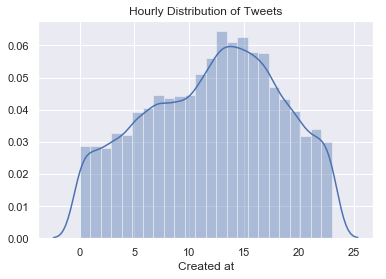

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt



# Set the seaborn style
sns.set()

# Plot the histogram of hours
sns.distplot(tweets_processed["Created at"].dt.hour, bins=24)
plt.title("Hourly Distribution of Tweets")
plt.show()

In [ ]:
# Print the value counts of Country column
print(tweets_processed["Country"].value_counts())

unknown    32396
US          2650
GB          1034
IN           681
CA           195
NG           103
SG            99
AU            84
ZA            81
SA            70
MY            62
IE            59
PK            55
DE            44
PH            37
FR            31
ES            30
UG            29
LK            22
NZ            21
MX            20
EE            18
AF            17
CH            15
HK            15
ID            13
AE            13
TR            12
KE            12
JP            11
           ...  
PE             2
PR             2
CL             2
KZ             1
SV             1
KH             1
TD             1
GN             1
GG             1
GT             1
GI             1
RO             1
EC             1
CI             1
JE             1
LS             1
IQ             1
YE             1
BS             1
MA             1
IM             1
IS             1
MC             1
TN             1
AG             1
LT             1
HN             1
TW            

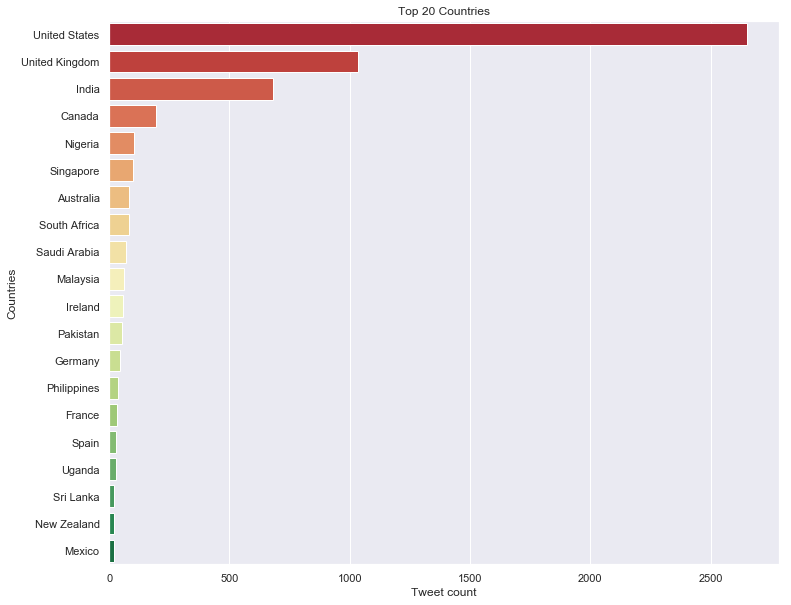

In [ ]:

# We need to exclude unknowns
countries = tweets_processed[tweets_processed.Country!='unknown']

# Select the top 20 countries
top_countries = countries["Country"].value_counts(sort=True).head(20)

# Convert alpha2 country codes to country names and store in a list
country_fullnames = []
for alpha2 in top_countries.index:
    country_fullnames.append(pycountry.countries.get(alpha_2=alpha2).name)

# Visualize the top 20 countries
plt.figure(figsize=(12,10))
sns.barplot(y=country_fullnames,x=top_countries, orient="h", palette="RdYlGn")
plt.xlabel("Tweet count")
plt.ylabel("Countries")
plt.title("Top 20 Countries")
plt.show()

In [ ]:
pd.options.display.max_rows
pd.set_option('display.max_colwidth', -1)

# Display the most popular tweets
display(tweets_processed.sort_values(by=["Favorites","Retweet-Count", ], axis=0, ascending=False)[["Content","Retweet-Count","Favorites"]].head(20))



,Content,Retweet-Count,Favorites
26162,Complaints are being received about private unaided schools demanding excess fee. Students who are unable to pay fees are prevented from participating in online classes. Children's education cannot be denied. Instructed officials to enquire and take strict action.,761,6673
25332,"A time bound project will be implemented to provide internet connectivity to students all across Kerala, so that online education continues unhindered. In 4 days, framework will be drafted by a Committee comprising Principal Secretary (IT) and reps of telecom service providers.",264,2991
34679,"Other ethnic groups are allowed to have &amp; express their culture and concerns regarding others respecting it but not black ppl. Oh no, not us. We gotta argue all day online asking for respect of OUR culture and “teaching” others a million times. It’s not fair",181,1273
29332,"To ensure internet availability to all students, the CM has convened a meeting of Internet Service Providers on 10 June, at 10 am. The meeting is being convened so that lack of adequate connectivity does not affect online education in certain areas, including adivasi hamlets.",110,1081
29491,"Technical education department @UPGovt is finalising the modalities to hold online exams for students in its technical institutes under three universities @AKTU_Lucknow @HbtuKanpur, MMMUT Gorakhpur.",366,1052
...,...,...,...
1911,"1/\r\r\r\nI feel like I need to deal with this thread in a way which is robust. Because this entire thread misses the point of the entire debate about Critical Social Justice in education.\r\r\r\n\r\r\r\nSo, why CRT should be removed from the curriculum.\r\r\r\n\r\r\r\nA Thread🧵 https://t.co/Akl2Q8ITim",224,640
37222,This student's video on taxing online classes during the pandemic has forced the J&amp;K administration to change its teaching policy this week.\r\r\r\nhttps://t.co/xMeJQ7p7mi,39,607
5967,Hon’ble PM Shri @NarendraModi Ji’s initiative PM eVidya was launched in May ’20. It envisages the concept of e-learning for differently-abled children. (1/2) https://t.co/stDiP8gsoS,70,518
28064,"sooo we can all agree that art education, like most things in life, exists on a spectrum and regardless of whether you go to private college, take online courses, or watch free YouTube videos you have to adapt your learning methods to your own circumstances and abilities, yes?",67,517


In [ ]:

# Create a new DataFrame called frequencies
frequencies = pd.DataFrame(tfidf_matrix.sum(axis=0).T,index=vectorizer.get_feature_names(),columns=['total frequency'])

# Sort the words by frequency
frequencies.sort_values(by='total frequency',ascending=False, inplace=True)
# Display the most 20 frequent words
display(frequencies.head(20))

,total frequency
onlineclasses,898.132524
pay,749.218715
help,604.360164
due,568.254651
essaypay,492.494638
...,...
essays,353.813122
join,353.593648
javascript,348.980324
biology,346.769612


In [ ]:
# !pip install WordCloud

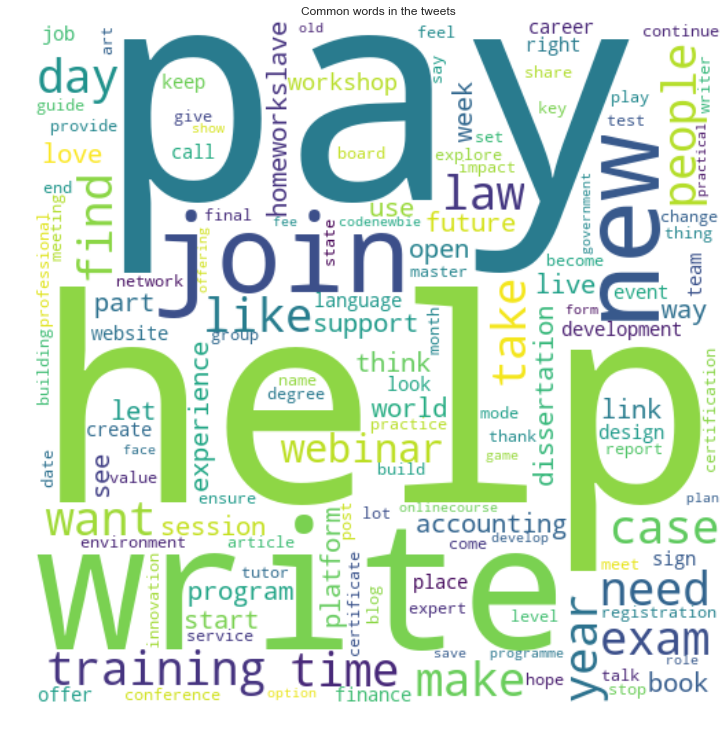

In [ ]:
from wordcloud import WordCloud
# Join the indexes
frequent_words = " ".join(frequencies.index)+" "

# Initialize the word cloud
wc = WordCloud(width = 500, height = 500, min_font_size = 10, max_words=2000, background_color ='white', stopwords= tfidf_stops)

# Generate the world clouds for each type of label
tweets_wc = wc.generate(frequent_words)

# Plot the world cloud                     
plt.figure(figsize = (10, 10), facecolor = None) 
plt.imshow(tweets_wc, interpolation="bilinear") 
plt.axis("off") 
plt.title("Common words in the tweets")
plt.tight_layout(pad = 0) 
plt.show()

In [ ]:
# !pip install TextBlob

In [ ]:
from textblob import TextBlob

# Add polarities and subkectivities into the DataFrame by using TextBlob
tweets_processed["Polarity"] = tweets_processed["Processed"].apply(lambda word: TextBlob(word).sentiment.polarity)
tweets_processed["Subjectivity"] = tweets_processed["Processed"].apply(lambda word: TextBlob(word).sentiment.subjectivity)

# Display the Polarity and Subjectivity columns
display(tweets_processed[["Polarity","Subjectivity"]].head(10))

,Polarity,Subjectivity
0,0.400000,0.433333
1,0.000000,0.000000
2,-0.040909,0.263636
3,0.166667,0.250000
4,0.216667,0.416667
5,0.000000,0.000000
6,0.278788,0.618182
7,-0.400000,0.400000
8,0.133333,0.466667
9,0.000000,0.000000


In [ ]:

# Define a function to classify polarities
def analyse_polarity(polarity):
    if polarity > 0:
        return "Positive"
    if polarity == 0:
        return "Neutral"
    if polarity < 0:
        return "Negative"

# Apply the funtion on Polarity column and add the results into a new column
tweets_processed["Label"] = tweets_processed["Polarity"].apply(analyse_polarity)

# Display the Polarity and Subjectivity Analysis
display(tweets_processed[["Label"]].head(10))

,Label
0,Positive
1,Neutral
2,Negative
3,Positive
4,Positive
5,Neutral
6,Positive
7,Negative
8,Positive
9,Neutral


In [ ]:
# Print the value counts of the Label column
print(tweets_processed["Label"].value_counts())

Positive    19902
Neutral     12713
Negative    5597 
Name: Label, dtype: int64


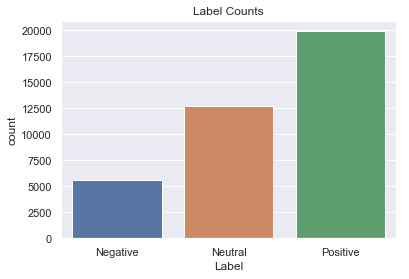

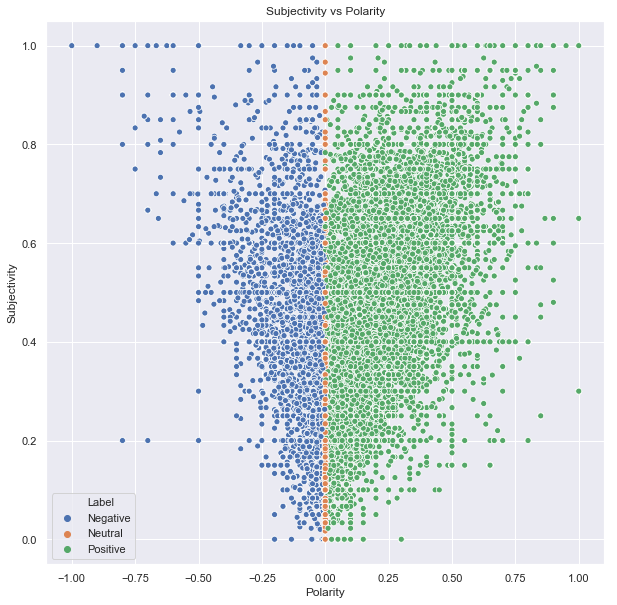

In [ ]:

# Change the datatype as "category"
tweets_processed["Label"] = tweets_processed["Label"].astype("category")

# Visualize the Label counts
sns.countplot(tweets_processed["Label"])
plt.title("Label Counts")
plt.show()

# Visualize the Polarity scores
plt.figure(figsize = (10, 10)) 
sns.scatterplot(x="Polarity", y="Subjectivity", hue="Label", data=tweets_processed)
plt.title("Subjectivity vs Polarity")
plt.show()

In [ ]:
# Display the positive tweets
display(tweets_processed.sort_values(by=["Polarity","Favorites","Retweet-Count", ], axis=0, ascending=[False, False, False])[["Content","Retweet-Count","Favorites","Polarity"]].head(20))

# Display the negative tweets
display(tweets_processed.sort_values(by=["Polarity", "Favorites", "Retweet-Count"], axis=0, ascending=[True, False, False])[["Content","Retweet-Count","Favorites","Polarity"]].head(20))

,Content,Retweet-Count,Favorites,Polarity
30023,"In order to implement #NEP2020, @CUHofficial is reforming the curriculum of all UG and PG courses. The university also plans to adopt a blended-learning mode that combines online and offline instructions.\r\r\r\n\r\r\r\nAll the best!\r\r\r\n\r\r\r\nhttps://t.co/BxyZFSFnx2 https://t.co/4NnMsJOVgf",32,185,1.0
11824,Time to revisit the 2018 NFL Draft...\r\r\r\n\r\r\r\n- Ranking all 32 draft classes\r\r\r\n- Best steals/values\r\r\r\n- Plenty of swings and misses (i.e. learning opportunity)\r\r\r\n\r\r\r\nhttps://t.co/wyezWfeJbo,9,106,1.0
5008,Education minister lauds UNESCO’s recognition of #Saudi e-learning model among world's best https://t.co/LdayjcaYlH,1,37,1.0
34620,"I'm teaching two sections of Introduction to Fiction Writing in the fall at @douglascollege-one online &amp; one on campus. My classes are 20-seat max, guaranteeing written feedback from me + peer-to-peer feedback. Douglas has excellent CRWR profs &amp; courses: \r\r\r\nhttps://t.co/wDyjygTVwP",4,31,1.0
23580,Dont let a child do away without school.\r\r\r\nDownload the @primelearn1 App for the best online education. https://t.co/1dkXLQPqxx\r\r\r\n#PrimeLearnUg https://t.co/D1MF6T0NwB,21,27,1.0
...,...,...,...,...
11491,"As 🏫 across 🇦🇺 and 🇮🇳 prepare to recommence face-to-face teaching, questions are being asked about how to best overcome the learning gaps, anxiety, and trauma caused by the COVID disruption.\r\r\r\n\r\r\r\nJoin us from 4PM (AEST) for a discussion on #Wellbeing. \r\r\r\n\r\r\r\n➡️ https://t.co/52ya6gHrOt https://t.co/yCedXtSLiV",2,8,1.0
30915,Learn how to make an awesome conference submission. Thursday 17 June 2021 1:00-2:00pm AEST https://t.co/nBCYLFEubx\r\r\r\n#AJET #ascilite2021 #onlinelearning #TEL https://t.co/owfOealPYs,2,8,1.0
23950,"Education is changing. Keep growing. Join us for ""Foundations and Flexibility: The Art and Science of Teaching in Any Context,"" a 1-hr webinar discussing best practices in online instruction. @THBoogren @PaulaMaeker @KatieWhite426 Register today: https://t.co/5ABrvJ1vyo https://t.co/DbOU06ZzFZ",6,6,1.0
7882,"Looking for a company that provides comprehensive #languagelearning Solutions for learners and employees? Well, you can get the best of that from our team at #Acadecraft! https://t.co/LgNs8sZiMA #edutech #professionalservice #elearning #COVID19 #USA #StayHome #Wednesdayvibe https://t.co/No86066UJM",0,6,1.0


,Content,Retweet-Count,Favorites,Polarity
24170,“The effects can be devastating because of the speed of transmission of misinformation.”\r\r\r\n\r\r\r\nOur CEO @Imi_ahmed discusses the impact of online misinformation in education in the @financialtimes @AndresSchipani\r\r\r\n\r\r\r\nhttps://t.co/iGU8uMAfZn,3,3,-1.0
15221,As our initiative We r launching #Kids activity video every week to overcome there #Anxiety #Stress frm boring #OnlineClasses \r\r\r\nDM to @KratiPareek fr more !!!\r\r\r\n#HappyBirthdayNBK #JitinPrasad \r\r\r\n#nusratjahan #Covid #Loki #byjus \r\r\r\n#AlluArjun #Rajasthan #Maanaadu \r\r\r\n#Jaipur #balckfungus https://t.co/ZN9HsCBgon,1,2,-1.0
13075,"@MrTeach47 @MsJDAN42 Also, online learning is extremely terrible for kids - i.e. screen time. I get it.",0,2,-1.0
24863,Google Seeks to Break Vicious Cycle of Online Slander link: https://t.co/yLCpYioBR6 #technology #tech #innovation #engineering #business #design #technews #gadgets #programming #software #computer #coding #education #security #techie,4,1,-1.0
12780,"@sevensixfive KSR seems to waffle but wait! and find you're learning about chemistry, culture, change, and humanity. \r\r\r\n\r\r\r\nThe start is horrific, soon that'll happen somewhere; it's gotten close in Iran, Paris, Moscow.. since 2003. For immune compromised (e.g. MS) and for wildlife it's here now.",0,1,-1.0
...,...,...,...,...
12622,@AliAbdaal is earning since he was 13 (i.e. 2011) that too by learning skills online. That's insane.,0,0,-1.0
17163,Automate the Boring Stuff with Python Programming - https://t.co/dKGhSBxACX #onlineclasses #onlinecourses #freeonlinecourses #onlinetutorials https://t.co/MZ2Hoc7TKi,0,0,-1.0
24523,"@Naveen_Odisha rqst ur intervention as odia language excluded but teaching in other languages Gujarati, Marathi, Bengali etc continues in Swayam Online Portal of Education Ministry. Shocking, discriminatory.\r\r\r\n#President, Samajwadi Party Odisha.\r\r\r\n@PMOIndia https://t.co/ySmgVwbfuL",0,0,-1.0
36105,also teaching online in this heat is disgusting,0,0,-1.0


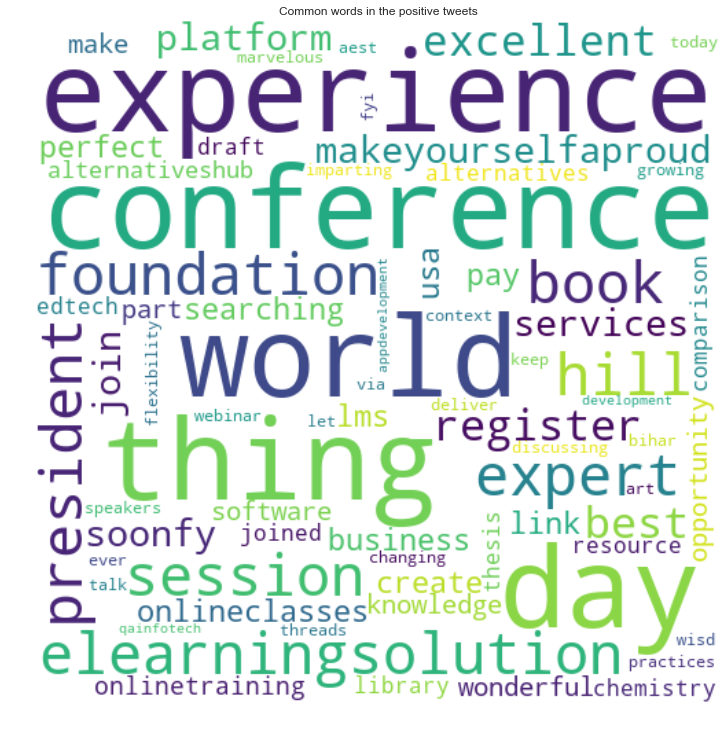

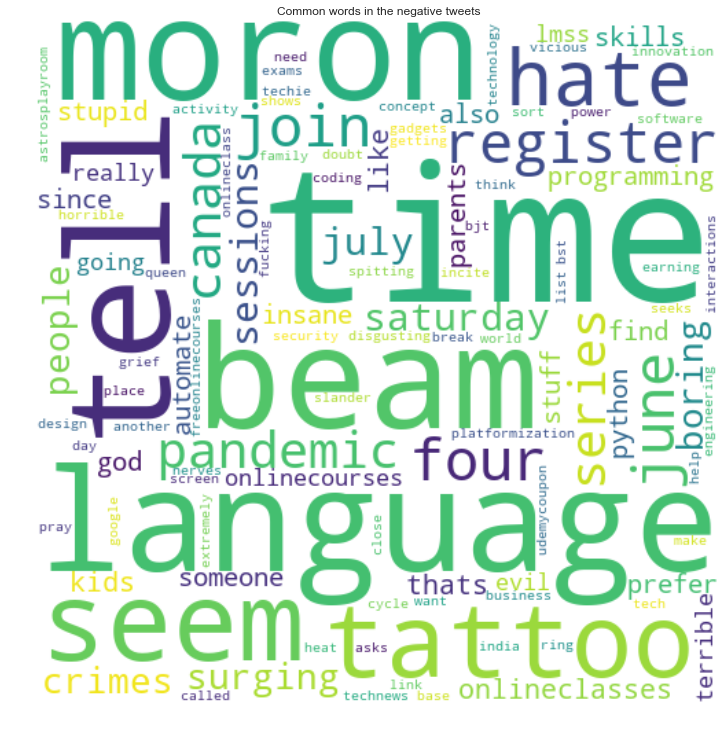

In [ ]:
# Apparently, we have been successful in labeling the polarities. Let's check the positive/negative tweets by country. Now we can make word clouds for positive and negative tweets to understand what people like and dislike.


def make_wordcloud(data, label):

    # Initialize a Tf-idf Vectorizer
    polarity_vectorizer = TfidfVectorizer(max_features=5000, stop_words= tfidf_stops)

    # Fit and transform the vectorizer
    tfidf_matrix_polarity = polarity_vectorizer.fit_transform(data["Processed"])

    # Create a new DataFrame called frequencies
    frequencies_polarity = pd.DataFrame(tfidf_matrix_polarity.sum(axis=0).T,index=polarity_vectorizer.get_feature_names(),columns=['total frequency'])

    # Sort the words by frequency
    frequencies_polarity.sort_values(by='total frequency',ascending=False, inplace=True)

    # Join the indexes
    frequent_words_polarity = " ".join(frequencies_polarity.index)+" "

    # Initialize the word cloud
    wc = WordCloud(width = 500, height = 500, min_font_size = 10, max_words=2000, background_color ='white', stopwords= tfidf_stops)

    # Generate the world clouds for each type of label
    tweets_polarity = wc.generate(frequent_words_polarity)

    # Plot the world cloud                     
    plt.figure(figsize = (10, 10), facecolor = None) 
    plt.imshow(tweets_polarity, interpolation="bilinear") 
    plt.axis("off") 
    plt.title("Common words in the " + label +" tweets")
    plt.tight_layout(pad = 0) 
    plt.show() 

# Create DataFrames for each label
positive_popular_df = tweets_processed.sort_values(by=["Polarity","Favorites","Retweet-Count", ], axis=0, ascending=[False, False, False])[["Content","Retweet-Count","Favorites","Polarity","Processed"]].head(50)
negative_popular_df = tweets_processed.sort_values(by=["Polarity", "Favorites", "Retweet-Count"], axis=0, ascending=[True, False, False])[["Content","Retweet-Count","Favorites","Polarity","Processed"]].head(50)

# Call the function
make_wordcloud(positive_popular_df, "positive")
make_wordcloud(negative_popular_df, "negative")

Positive 

Country
US    372
GB    88 
IN    68 
CA    31 
SA    18 
      .. 
CY    1  
CO    1  
CN    1  
CM    1  
BR    1  
Name: Country, Length: 62, dtype: int64

Negative

Country
US    960
GB    504
IN    339
CA    123
NG    87 
      .. 
BH    1  
BB    1  
AT    1  
AG    1  
YE    1  
Name: Country, Length: 88, dtype: int64


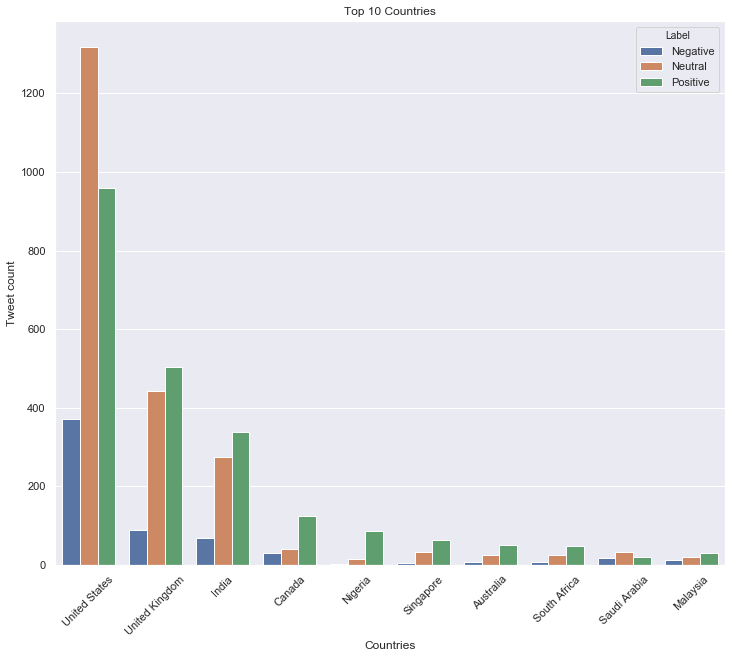

In [ ]:
# Let's look at the positive and negative tweet counts by country.


# Get the positive/negative counts by country
positives_by_country = tweets_processed[tweets_processed.Country!='unknown'].groupby("Label")["Country"].value_counts().Negative.sort_values(ascending=False)
negatives_by_country =tweets_processed[tweets_processed.Country!='unknown'].groupby("Label")["Country"].value_counts().Positive.sort_values(ascending=False)

# Print them out
print("Positive \n")
print(positives_by_country)
print("\nNegative\n")
print(negatives_by_country)

# Create a mask for top 1 countries (by tweets count)
mask = tweets_processed["Country"].isin(top_countries.index[:10]).values

# Create a new DataFrame only includes top10 country
top_20df = tweets_processed.iloc[mask,:]

# Visualize the top 20 countries
plt.figure(figsize=(12,10))
sns.countplot(x="Country", hue="Label", data=top_20df, order=top_20df["Country"].value_counts().index)
plt.xlabel("Countries")
locs, labels = plt.xticks()
plt.xticks(locs, country_fullnames[:10])
plt.xticks(rotation=45)
plt.ylabel("Tweet count")
plt.title("Top 10 Countries")
plt.show()

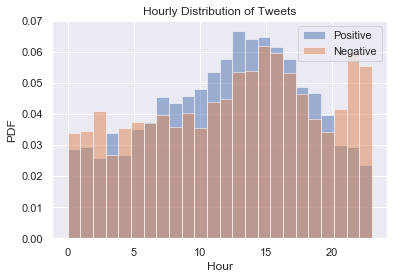

In [ ]:
# Can the time tell us something about polarity ?

positive = tweets_processed.loc[tweets_processed.Label=="Positive"]["Created at"].dt.hour
negative = tweets_processed.loc[tweets_processed.Label=="Negative"]["Created at"].dt.hour

plt.hist(positive, alpha=0.5, bins=24, label="Positive", density=True)
plt.hist(negative, alpha=0.5, bins=24, label="Negative", density=True)
plt.xlabel("Hour")
plt.ylabel("PDF")
plt.title("Hourly Distribution of Tweets")
plt.legend(loc='upper right')
plt.show()

In [ ]:
# Save the DataFrame
tweets_processed.to_csv("tweets_sentiments.csv")

## **Classification ** 

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd /content/drive/MyDrive/tweets/

%pwd


/content/drive/MyDrive/tweets


'/content/drive/MyDrive/tweets'

In [ ]:
# Sklearn
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import BernoulliNB
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import cross_val_score

In [ ]:
# Load the processed DataFrame
tweets_processed = pd.read_csv("tweets_sentiments.csv")

NameError: ignored

In [ ]:
# Buid a Machine Learning model We have labeled the tweets according to their polarity scores. Let's build a Machine Learning model by using Multinomial Naive Bayes Classifier. Let's start with selection of the features and the target.


# Encode the labels
le = LabelEncoder()
tweets_processed["Label_enc"] = le.fit_transform(tweets_processed["Label"])

# Display the encoded labels
display(tweets_processed[["Label_enc"]].head())

# Select the features and the target
X = tweets_processed['Processed']
y = tweets_processed["Label_enc"]

,Label_enc
0,2
1,1
2,0
3,2
4,2


In [ ]:

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=34, stratify=y)

In [ ]:
# Create the tf-idf vectorizer
model_vectorizer = TfidfVectorizer()

# First fit the vectorizer with our training set
tfidf_train = vectorizer.fit_transform(X_train)

# Now we can fit our test data with the same vectorizer
tfidf_test = vectorizer.transform(X_test)

# Initialize the Bernoulli Naive Bayes classifier
nb = BernoulliNB()

# Fit the model
nb.fit(tfidf_train, y_train)

# Print the accuracy score
best_accuracy = cross_val_score(nb, tfidf_test, y_test, cv=10, scoring='accuracy').max()
print("Accuracy:",best_accuracy)

Accuracy: 0.7630890052356021


In [ ]:
# Predict the labels
y_pred = nb.predict(tfidf_test)

# Print the Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
print("Confusion Matrix\n")
print(cm)

# Print the Classification Report
cr = classification_report(y_test, y_pred)
print("\n\nClassification Report\n")
print(cr)

Confusion Matrix

[[ 606   74  439]
 [ 138 1704  701]
 [ 261  175 3545]]


Classification Report

             precision    recall  f1-score   support

          0       0.60      0.54      0.57      1119
          1       0.87      0.67      0.76      2543
          2       0.76      0.89      0.82      3981

avg / total       0.77      0.77      0.76      7643



In [ ]:
# Save the model
import pickle
pickle.dump(nb, open("model.pkl", 'wb'))

In [ ]:
# Load the processed DataFrame
tweets_processed = pd.read_csv("tweets_sentiments.csv", parse_dates=["Created at"])

In [ ]:
!pip install textblob
!pip install jsonpickle

You should consider upgrading via the 'c:\users\mahdi\anaconda3\python.exe -m pip install --upgrade pip' command.


  Using cached zipp-3.4.1-py3-none-any.whl (5.2 kB)


You should consider upgrading via the 'c:\users\mahdi\anaconda3\python.exe -m pip install --upgrade pip' command.


In [ ]:

import tweepy
from textblob import TextBlob
import jsonpickle
import pandas as pd
import json

In [ ]:

CONSUMER_KEY = 'pTErTp0DkHo3MPga2deNcsE3p'
CONSUMER_SECRET = 'PeoUaZfLHRtdX0tyfBTbE3wrjzxbC51Iej7wevDzWdVMOkPbMD'
ACCESS_KEY = '1392749972-Fi4mOXx3lcfPimn6dFMgIQHAvxOcFgVFCgDHPpE'
ACCESS_SECRET = 'recyiajiZDHemiPBydnEjMHbjp3tm6NNsiISrqdQni9hF'


auth = tweepy.OAuthHandler(CONSUMER_KEY, CONSUMER_SECRET)
auth.set_access_token(ACCESS_KEY, ACCESS_SECRET)
auth.secure = True
api = tweepy.API(auth, wait_on_rate_limit=True, wait_on_rate_limit_notify=True)

In [ ]:
# hashtags = ["#distancelearning", \
#             "#onlineschool",     \
#             "#onlineteaching",   \
#             "#virtuallearning",  \
#             "#onlineducation",   \
#             "#distanceeducation",\
#             "#OnlineClasses",    \
#             "#DigitalLearning",  \
#             "#elearning",        \
#             "#onlinelearning"]

# # Create a search list
# search_list = ["distance learning",  \
#                "online teaching",    \
#                "online education,",  \
#                "online course",      \
#                "online semester",    \
#                "distance course",    \
#                "distance education", \
#                "online class",       \
#                "e-learning",         \
#                "e learning"]

# searchQuery = ' #distancelearning OR #onlineschool OR #onlineteaching OR #virtuallearning OR #onlineducation OR #distanceeducation OR #OnlineClasses OR #DigitalLearning OR #elearning OR #onlinelearning OR distance learning OR online teaching OR online education OR online course OR online semester OR distance course OR distance education OR e-learning OR e learning '

searchQuery = 'online class OR #onlineclass  '
retweet_filter='-filter:retweets'

q=searchQuery +retweet_filter
tweetsPerQry = 100
fName = 'tweets.txt'
sinceId = None

In [ ]:
max_id = -1
maxTweets = 100000

tweetCount = 0
print("Downloading max {0} tweets".format(maxTweets))
with open(fName, 'w') as f:
    while tweetCount < maxTweets:
        tweets = []
        try:
            if (max_id <= 0):
                if (not sinceId):
                    new_tweets = api.search(q=q, lang ="en", count=tweetsPerQry, tweet_mode='extended')

                else:
                    new_tweets = api.search(q=q, lang ="en", count=tweetsPerQry,
                                        since_id=sinceId, tweet_mode='extended')
            else:
                if (not sinceId):
                    new_tweets = api.search(q=q, lang ="en", count=tweetsPerQry,
                                        max_id=str(max_id - 1), tweet_mode='extended')
                else:
                    new_tweets = api.search(q=q, lang ="en", count=tweetsPerQry,
                                        max_id=str(max_id - 1),
                                        since_id=sinceId, tweet_mode='extended')

            if not new_tweets:
                print("No more tweets found")
                break
            for tweet in new_tweets:
                f.write(str(tweet.full_text.replace('\n','').encode("utf-8"))+"\n")

            tweetCount += len(new_tweets)
            print("Downloaded {0} tweets".format(tweetCount))
            max_id = new_tweets[-1].id
                
        except tweepy.TweepError as e:
            # Just exit if any error
            print("some error : " + str(e))
            break
                
print ("Downloaded {0} tweets, Saved to {1}".format(tweetCount, fName))

Downloaded 62 tweets
Downloaded 112 tweets
Downloaded 199 tweets
Downloaded 297 tweets
Downloaded 369 tweets
Downloaded 427 tweets
Downloaded 515 tweets
Downloaded 613 tweets
Downloaded 713 tweets
Downloaded 813 tweets
Downloaded 913 tweets
Downloaded 1011 tweets
Downloaded 1111 tweets
Downloaded 1211 tweets
Downloaded 1311 tweets
Downloaded 1411 tweets
Downloaded 1511 tweets
Downloaded 1611 tweets
Downloaded 1711 tweets
Downloaded 1803 tweets
Downloaded 1903 tweets
Downloaded 2003 tweets
Downloaded 2103 tweets
Downloaded 2203 tweets
Downloaded 2303 tweets
Downloaded 2403 tweets
Downloaded 2503 tweets
Downloaded 2603 tweets
Downloaded 2703 tweets
Downloaded 2803 tweets
Downloaded 2903 tweets
Downloaded 3003 tweets
Downloaded 3103 tweets
Downloaded 3203 tweets
Downloaded 3303 tweets
Downloaded 3403 tweets
Downloaded 3503 tweets
Downloaded 3603 tweets
Downloaded 3703 tweets
Downloaded 3803 tweets
Downloaded 3903 tweets
Downloaded 4003 tweets
Downloaded 4103 tweets
Downloaded 4203 tweets


Rate limit reached. Sleeping for: 773


Downloaded 17462 tweets
Downloaded 17562 tweets
Downloaded 17661 tweets
Downloaded 17761 tweets
Downloaded 17861 tweets
Downloaded 17961 tweets
Downloaded 18061 tweets
Downloaded 18161 tweets
Downloaded 18261 tweets
Downloaded 18361 tweets
Downloaded 18461 tweets
Downloaded 18561 tweets
Downloaded 18661 tweets
Downloaded 18761 tweets
Downloaded 18861 tweets
Downloaded 18961 tweets
Downloaded 19061 tweets
Downloaded 19161 tweets
Downloaded 19261 tweets
Downloaded 19361 tweets
Downloaded 19459 tweets
Downloaded 19559 tweets
Downloaded 19659 tweets
Downloaded 19759 tweets
Downloaded 19859 tweets
Downloaded 19959 tweets
Downloaded 20059 tweets
Downloaded 20159 tweets
Downloaded 20259 tweets
Downloaded 20359 tweets
Downloaded 20459 tweets
Downloaded 20559 tweets
Downloaded 20659 tweets
Downloaded 20759 tweets
Downloaded 20859 tweets
Downloaded 20959 tweets
Downloaded 21059 tweets
Downloaded 21159 tweets
Downloaded 21222 tweets
Downloaded 21276 tweets
Downloaded 21376 tweets
Downloaded 21476

Rate limit reached. Sleeping for: 782


Downloaded 34742 tweets
Downloaded 34842 tweets
Downloaded 34942 tweets
Downloaded 35042 tweets
Downloaded 35142 tweets
Downloaded 35242 tweets
Downloaded 35338 tweets
Downloaded 35438 tweets
Downloaded 35538 tweets
Downloaded 35635 tweets
Downloaded 35735 tweets
Downloaded 35835 tweets
Downloaded 35935 tweets
Downloaded 36035 tweets
Downloaded 36135 tweets
Downloaded 36235 tweets
Downloaded 36333 tweets
Downloaded 36433 tweets
Downloaded 36533 tweets
Downloaded 36633 tweets
Downloaded 36733 tweets
Downloaded 36833 tweets
Downloaded 36933 tweets
Downloaded 37033 tweets
Downloaded 37133 tweets
Downloaded 37233 tweets
Downloaded 37333 tweets
Downloaded 37433 tweets
Downloaded 37533 tweets
Downloaded 37633 tweets
Downloaded 37733 tweets
Downloaded 37833 tweets
Downloaded 37933 tweets
Downloaded 38033 tweets
Downloaded 38133 tweets
Downloaded 38233 tweets
Downloaded 38333 tweets
Downloaded 38433 tweets
Downloaded 38533 tweets
Downloaded 38633 tweets
Downloaded 38733 tweets
Downloaded 38833

In [ ]:
import re

def clean(tweet):
    tweet = re.sub(r'^RT[\s]+', '', tweet)
    tweet = re.sub(r'https?:\/\/.*[\r\n]*', '', tweet)
    tweet = re.sub(r'#', '', tweet)
    tweet = re.sub(r'@[A-Za-z0–9]+', '', tweet) 
    return tweet

def read_tweets(file_name):
    with open(file_name, 'r') as f:
        tweets = [clean(line.strip()) for line in f]
    f.close()
    return tweets

In [ ]:
tweets = read_tweets(fName)
print(tweets[2])
print(TextBlob(tweets[2]).sentiment)

b'Excellent grade assured hmuPsychologyJavaScriptPythonLiteratureDiscussionAccountingEconomicsAlgebraSummer classes Essay payAssignment dueOnline classMathHomeworkCalculusStatisticsPhysicsDm or email us at executivewriters247.com'
Sentiment(polarity=1.0, subjectivity=1.0)


In [ ]:
tweets

["b'Dm to place your order! MathlabBiologySummer classes Essay dueSomeone write Case studyDo my homeworkOnline class essaypayEnglish class MathLiterature reviewpay assignmentPhilosophyKindly DM ",
 "b' I write essay and take online classes (math and sciences included).DM for summer class help!Email me: kipngenotim.com'",
 "b'Excellent grade assured hmuPsychologyJavaScriptPythonLiteratureDiscussionAccountingEconomicsAlgebraSummer classes Essay payAssignment dueOnline classMathHomeworkCalculusStatisticsPhysicsDm or email us at executivewriters247.com'",
 'b" True that is what I\'m also thinking baya even though kapoy na kaayo ang online class specially nursing no, pero i have fam members that are vulnerable."',
 "b'Kind Dm us to help you in;Write essaysThesisEnglishPay examassignmentHomework duestatsTerm paperResearch paper chemistryprojecthistory  Online class StatisticsMathlabBiologyPaper write Literature Homework PhysicsWhatsApp text/call+1(435)660-7508'",
 "b'Kind Dm us to help you i

In [ ]:
polarity = lambda x: TextBlob(x).sentiment.polarity
subjectivity = lambda x: TextBlob(x).sentiment.subjectivity

In [ ]:
import numpy as np

tweet_polarity = np.zeros(len(tweets))
tweet_subjectivity = np.zeros(len(tweets))

for idx, tweet in enumerate(tweets):
    tweet_polarity[idx] = polarity(tweet)
    tweet_subjectivity[idx] = subjectivity(tweet)

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

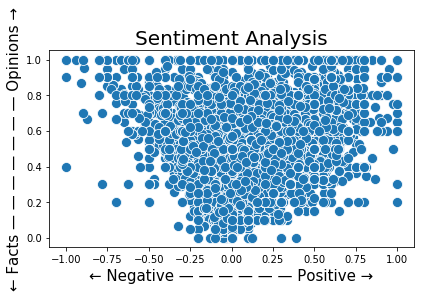

In [ ]:
sns.scatterplot(tweet_polarity, # X-axis
                tweet_subjectivity,  # Y-axis
                s=100);


plt.title("Sentiment Analysis", fontsize = 20)
plt.xlabel('← Negative — — — — — — Positive →', fontsize=15)
plt.ylabel('← Facts — — — — — — — Opinions →', fontsize=15)
plt.tight_layout()

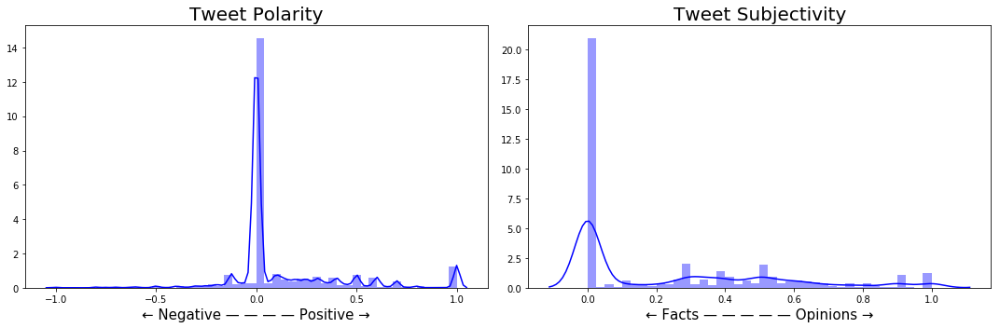

In [ ]:
f, axs = plt.subplots(1, 2, figsize=(15,5))

sns.distplot(tweet_polarity, color="b", ax=axs[0])
axs[0].set_title("Tweet Polarity", fontsize = 20)
axs[0].set_xlabel('← Negative — — — — Positive →', fontsize=15)
sns.distplot(tweet_subjectivity, color="b", ax=axs[1])
axs[1].set_title("Tweet Subjectivity", fontsize = 20)
axs[1].set_xlabel('← Facts — — — — — Opinions →', fontsize=15)

plt.tight_layout()

In [ ]:
type(tweets)

list

In [ ]:
with open('tweets_OC.txt', 'w') as f:
    for item in tweets:
        f.write("%s\n" % item)

In [ ]:
len(tweets)

10183

In [ ]:
data=pd.DataFrame(tweets,columns=['tweet'])
data

,tweet
0,b'Dm to place your order! MathlabBiologySummer...
1,b' I write essay and take online classes (math...
2,b'Excellent grade assured hmuPsychologyJavaScr...
3,"b"" True that is what I'm also thinking baya ev..."
4,b'Kind Dm us to help you in;Write essaysThesis...
5,b'Kind Dm us to help you in;Write essaysThesis...
6,b'Let us do your assignmentsResumesSummer clas...
7,b'Kind Dm us to help you in;Write essaysThesis...
8,b'\xe2\x96\xb6\xef\xb8\x8fHit me up for essays...
9,b'Kind Dm us to help you in;Write essaysThesis...


In [ ]:
data['tweet'] = data['tweet'].str[2:]
data.head()

,tweet
0,Dm to place your order! MathlabBiologySummer c...
1,I write essay and take online classes (math a...
2,Excellent grade assured hmuPsychologyJavaScrip...
3,True that is what I'm also thinking baya even...
4,Kind Dm us to help you in;Write essaysThesisEn...


In [ ]:
import re

regex = r"(\$+)(?:(?!\1)[\s\S])*\1"

data['tweet'] =  [re.sub(regex,'', str(x)) for x in data['tweet']]
data.head()

,tweet
0,Dm to place your order! MathlabBiologySummer c...
1,I write essay and take online classes (math a...
2,Excellent grade assured hmuPsychologyJavaScrip...
3,True that is what I'm also thinking baya even...
4,Kind Dm us to help you in;Write essaysThesisEn...


In [ ]:
data

,tweet
0,Dm to place your order! MathlabBiologySummer c...
1,I write essay and take online classes (math a...
2,Excellent grade assured hmuPsychologyJavaScrip...
3,True that is what I'm also thinking baya even...
4,Kind Dm us to help you in;Write essaysThesisEn...
5,Kind Dm us to help you in;Write essaysThesisEn...
6,Let us do your assignmentsResumesSummer classe...
7,Kind Dm us to help you in;Write essaysThesisEn...
8,\xe2\x96\xb6\xef\xb8\x8fHit me up for essays/h...
9,Kind Dm us to help you in;Write essaysThesisEn...


In [ ]:
# !pip install spacy
# !pip install BeautifulSoup
# !pip install unidecode
# !pip install w2n
# !pip install contractions
# !pip install WordCloud
# !pip install STOPWORDS
# !pip install ImageColorGenerator


In [ ]:
tweet_All

'Dm to place your order! MathlabBiologySummer classes Essay dueSomeone write Case studyDo my homeworkOnline class essaypayEnglish class MathLiterature reviewpay assignmentPhilosophyKindly DM   I write essay and take online classes (math and sciences included).DM for summer class help!Email me: kipngenotim.com\' Excellent grade assured hmuPsychologyJavaScriptPythonLiteratureDiscussionAccountingEconomicsAlgebraSummer classes Essay payAssignment dueOnline classMathHomeworkCalculusStatisticsPhysicsDm or email us at executivewriters247.com\'  True that is what I\'m also thinking baya even though kapoy na kaayo ang online class specially nursing no, pero i have fam members that are vulnerable." Kind Dm us to help you in;Write essaysThesisEnglishPay examassignmentHomework duestatsTerm paperResearch paper chemistryprojecthistory  Online class StatisticsMathlabBiologyPaper write Literature Homework PhysicsWhatsApp text/call+1(435)660-7508\' Kind Dm us to help you in;Write essaysThesisEnglishPay

TypeError: 'AxesSubplot' object does not support indexing

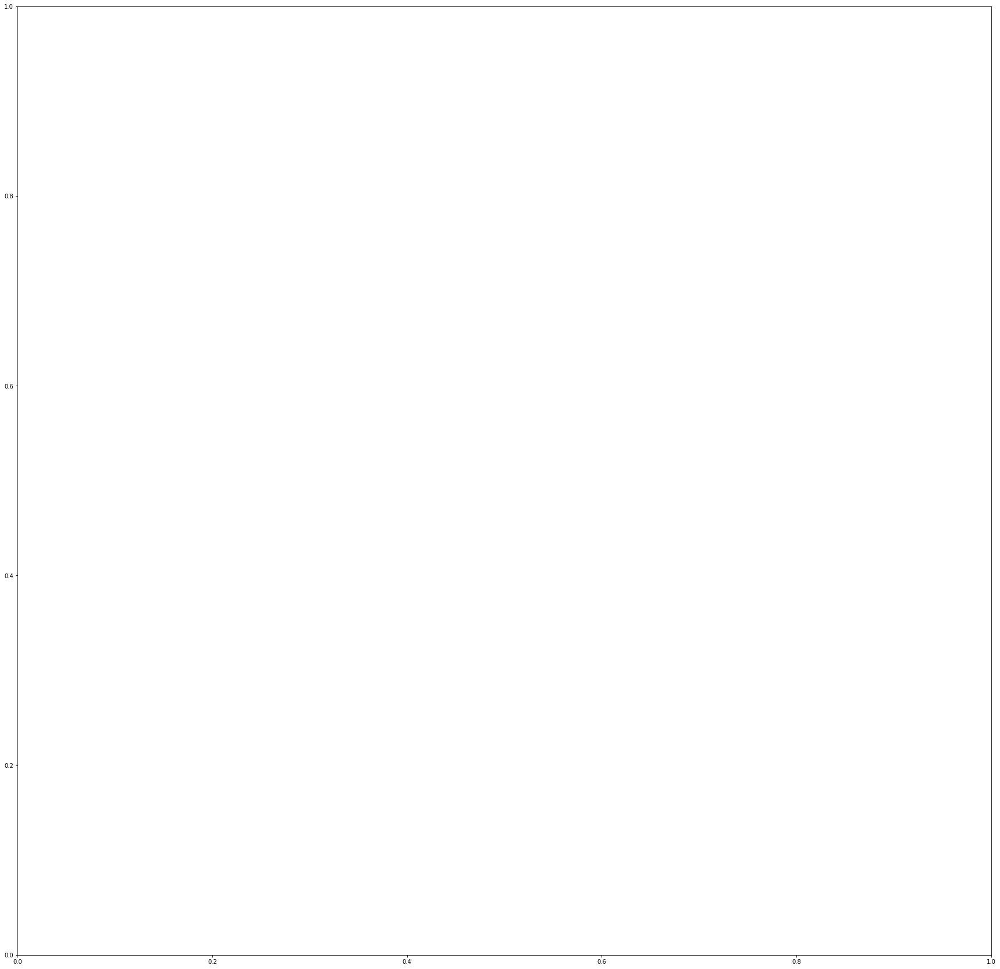

In [ ]:
from wordcloud import WordCloud, STOPWORDS , ImageColorGenerator
# Start with one review:

tweet_All = " ".join(review for review in data.tweet)

fig, ax = plt.subplots(1, 1, figsize  = (30,30))
# Create and generate a word cloud image:
wordcloud_ALL = WordCloud(max_font_size=50, max_words=100, background_color="white").generate(tweet_All)


# Display the generated image:
ax[0].imshow(wordcloud_ALL, interpolation='bilinear')
ax[0].set_title('All Tweets', fontsize=30)
ax[0].axis('off')


#wordcloud.to_file("img/first_review.png")

In [ ]:
def sentiment(text):
    try:
        return TextBlob(text).sentiment
    except:
        return None

In [ ]:
data['Polarity']     = data[tweet].apply(sentiment).apply(lambda x: x[1])
data['Subjectivity'] = data[tweet].apply(sentiment).apply(lambda x: x[2])
data

KeyError: "b'i need to wakeup early for tomorrow because i need to attend my last online class meeting \\xf0\\x9f\\xa7\\x8d\\xe2\\x80\\x8d\\xe2\\x99\\x80\\xef\\xb8\\x8f "